## ASSIGNMENT-3

TEAM-NAME: NERF™     

IDs: 2021101026, 2021111027, 2021101103

NAMEs: Mitansh Kayathwal, Gnana Prakash Punnavajhala, Vineeth Bhat

### Instructions
 * Fill in the team name, id and names of all the teams members in the cell above.
 * Code must be written in Python in Jupyter Notebooks. We highly recommend using anaconda distribution or at the minimum, virtual environments for this assignment.
 * All the code and result files should be uploaded in the github classroom.
 * You can use the in-built methods and **unless explicitly mentioned**, don't need to code from scratch for this assignment. Make sure your code is modular.
 * All the representations are expected to be in a right-hand coordinate system. All the functions related to transformation matrices, quaternions, and 3D projection are expected to be coded by you.
 * You could split the Jupyter Notebook cells where TODO is written, but please try to avoid splitting/changing the structure of other cells.
 * All the visualization should be done inside the notebook unless specified otherwise.
 * Plagiarism will lead to heavy penalty.
 * Commit this notebook in the GitHub Classroom repo and any other results files under the result folder. 
 * Commits past the deadline will not be considered.
 * Extensions will be granted using the extension policy only, so please go through the policy carefully and reach out to the TAs beforehand.
 * **Download the data for section 2 and 3 from this [link](https://iiitaphyd-my.sharepoint.com/:f:/g/personal/pranjali_pathre_research_iiit_ac_in/Elm4OCxD4VhBh6f9x2ufKsgBnWwkmWc-nXPjnS5jXWRTww?e=IzOlbb)**.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
from tqdm import tqdm
import open3d as o3d
import pickle
from copy import copy


Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


### SECTION 1: Epipolar lines and Epipoles

For this task, you have been given two images of the same scene taken from different view-points. You should first estimate the fundamental matrix that encodes their relative geometry from these two images.

<img src="data/1/img1.jpg" alt="image 1" width="400"/>
<img src="data/1/img2.jpg" alt="image 2" width="400"/>

Recall that given a point in one image, it's corresponding location in the other image can be found to along a line viz. the epipolar line. The task is to draw the epipolar lines in the second image for each given point in the first image. You have to repeat this for the other image as well. Draw epipolar lines on the first image for the corresponding points in the second image.

The convention used for F is $x'^{T}Fx$ where $x'$ is the location of the point in the second image. For this question you will need to compute the F matrix on your own without using inbuilt functions.

The point correspondences have been given in the folder `data/1`

In [2]:
##############################################################################
# TODO: Do tasks described in 1
##############################################################################

points1 = np.array(
[[381, 402],
 [452, 497],
 [671, 538],
 [501, 254],
 [506, 381],
 [474, 440],
 [471, 537],
 [498, 364],
 [706, 319],
 [635, 367]]
)

points2 = np.array(
[[390, 346],
 [439, 412],
 [651, 417],
 [477, 194],
 [482, 300],
 [456, 359],
 [454, 444],
 [475, 287],
 [686, 185],
 [606, 253]]
)
##############################################################################
# END OF YOUR CODE
##############################################################################

In [126]:
def transform_points(points):
    new_points = np.hstack((points, np.ones((points.shape[0], 1))))
    origin = np.mean(points, axis=0)
    scale = np.sqrt(2) / np.std(points)

    T = np.array([[scale, 0, -scale * origin[0]],
                  [0, scale, -scale * origin[1]],
                  [0, 0, 1]])

    return (T @ new_points.T).T, T


def compute_fundamental_matrix(points1, points2):
    normalized_points1, T1 = transform_points(points1)
    normalized_points2, T2 = transform_points(points2)

    # n point algorithm
    n = len(points1)
    A = np.zeros((n, 9))

    for i in range(n):
        x1, y1 = normalized_points1[i][0:2]
        x2, y2 = normalized_points2[i][0:2]

        A[i] = [x1 * x2, x1 * y2, x1, y1 * x2, y1 * y2, y1, x2, y2, 1]

    _, _, V = np.linalg.svd(A)
    F = V[-1].reshape(3, 3)

    U, S, Vt = np.linalg.svd(F)
    S[-1] = 0
    F = U @ np.diag(S) @ Vt
    F = T2.T @ F.T @ T1

    if F[2,2] < 0:
        F *= -1

    F = F / F[2][2]

    return F

# ours
our_fundamental_matrix = compute_fundamental_matrix(points1, points2)
print("Fundamental Matrix from our computation:")
print(our_fundamental_matrix)

# inbuilt
inbuilt_fundamental_matrix, _ = cv2.findFundamentalMat(points1, points2, cv2.FM_8POINT)
print("\nInbuilt Fundamental Matrix:")
print(inbuilt_fundamental_matrix)


Fundamental Matrix from our computation:
[[ 5.37445646e-07  1.37045567e-05 -9.57120117e-03]
 [-1.26442845e-05 -5.69342841e-08  5.80683844e-03]
 [ 6.81833007e-03 -6.04021308e-03  1.00000000e+00]]

Inbuilt Fundamental Matrix:
[[ 5.31986908e-07  1.38533331e-05 -9.66213374e-03]
 [-1.28116492e-05 -5.70742021e-08  5.91778384e-03]
 [ 6.90888253e-03 -6.13430839e-03  1.00000000e+00]]


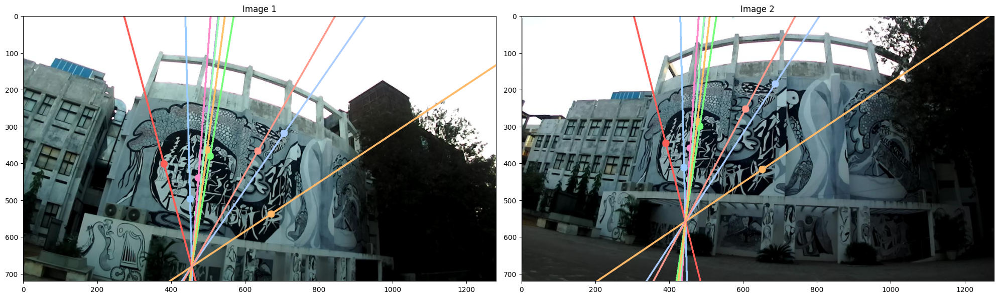

In [127]:
F = compute_fundamental_matrix(points1, points2)

def compute_epipolar_lines(F, points):
    lines = np.dot(F, np.hstack((points, np.ones((len(points), 1)))).T)
    lines /= np.sqrt(lines[0]**2 + lines[1]**2)
    return lines.T

# loading images
img1 = cv2.imread('./data/1/img1.jpg')
img2 = cv2.imread('./data/1/img2.jpg')

# converting colours
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

# a few nice colours
colours = [
    (255, 94, 87),
    (154, 204, 255),
    (255, 185, 104),
    (179, 157, 219),
    (118, 255, 123),
    (255, 138, 202),
    (153, 255, 178),
    (255, 193, 104),
    (170, 204, 255),
    (255, 154, 141)
]

pt_radius, line_thickness = 10, 3

for i, (x, y) in enumerate(points1):
    cv2.circle(img1, (x, y), pt_radius, colours[i], -1)

for i, (x, y) in enumerate(points2):
    cv2.circle(img2, (x, y), pt_radius, colours[i], -1)

lines2 = compute_epipolar_lines(F, points1)
for i, line in enumerate(lines2):
    x0, y0, x1, y1 = map(int, [0, -line[2] / line[1], img2.shape[1], -(line[2] + line[0] * img2.shape[1]) / line[1]])
    cv2.line(img2, (x0, y0), (x1, y1), colours[i], line_thickness)

lines1 = compute_epipolar_lines(np.transpose(F), points2)
for i, line in enumerate(lines1):
    x0, y0, x1, y1 = map(int, [0, -line[2] / line[1], img1.shape[1], -(line[2] + line[0] * img1.shape[1]) / line[1]])
    cv2.line(img1, (x0, y0), (x1, y1), colours[i], line_thickness)

fig, axes = plt.subplots(1, 2, figsize=(20, 30))
axes[0].imshow(img1)
axes[0].set_title('Image 1')
axes[1].imshow(img2)
axes[1].set_title('Image 2')

plt.tight_layout()
plt.show()

### SECTION 2: Visual Odometry

Visual odometry is the process of recovering the egomotion (the trajectory) of an agent using only the input from the camera or a system of cameras attached to the agent. This is a well-
studied problem in robotic vision and is a critical part of many applications such as mars rovers, and self-driving cars for localization. You will be implementing a basic monocular visual odometry algorithm in this part of the assignment.

To begin with, download all the required data from `data/2`. It contains a sequence of images from the KITTI dataset. The ground truth pose of each frame (in row-major order) and the camera parameters are provided as well.

#### Procedure
The following is an overview of the entire algorithm. 
1. Find the corresponding features between frames $I_{k}$ and $I_{k-1}$.
2. Using these features correspondances, estimate the essential matrix between the two images within a RANSAC sceme.
3. Decompose the essential matrix to obtain the relative rotation $R_k$ and transition $t_k$, and form the transformation $T_k$.
4. Scale the translation $t_k$ with the absolute or the relative scale. 
5. Concatenate the relative transformation by computing $C_k$ = $C_{k-1}$ $T_k$, where $C_{k-1}$ is the previous pose of the camera in the world frame. 
6. Repeat the above steps for the remaining pairs of frames.

The main task in computing visual odometry is to compute the relative transformation $T_k$ from each pair of images $I_k$ and $I_{k-1}$ and then to concatenate these transformations to recover the full trajectory of the camera. There are two broad approaches to compute the relative motion $T_k$: Appearance-based (or direct) method, which uses the intensity information of all the pixels in the input images and feature-based method which only uses salient and repeatable features extracted and tracked across the images. You will be implementing a feature-based method. 

For every new image $I_k$, the first step consists of detecting and matching 2D features with those from the previous frame. These 2D features are the locations in the image which we can reliably find in multiple images and possibly match them. To find these features use the inbuilt SIFT OpenCV implementation. 

Refer to [OpenCV documentation](https://docs.opencv.org/4.x/da/df5/tutorial_py_sift_intro.html) for the impementation details. 

As mentioned earlier, the main task is motion computation. Using these feature correspondences, implement the 8-point algorithm for fundamental matrix estimation. Implement it inside a RANSAC scheme to get rid of any outliers, as explained in class. Then, compute the essential matrix, and decompose it to the relative R and t using ```cv2.recoverPose```. Note that the function returns the R and t of the first camera with respect to the second, and not the other way around.

Now, you might recall that the absolute scale of the translation cannot be computed from just two images. The above function only returns the direction of t, as a unit vector. Use the ground truth translation to get the absolute scale, and multiply your unit translation with this scale. Then concatenate your transformations, and repeat for the next pair of frames to recover the full absolute trajector

Deliverables:
* A .txt file containing the estimated poses, provided in the same format as the ground truth.
* A plot of the estimated trajectory along with the ground truth trajectory. Also report the obtained trajectory error. Use [EVO](https://github.com/MichaelGrupp/evo) for this.
```
pip install evo --upgrade --no-binary evo
evo_traj kitti ground-truth.txt your-result.txt -va --plot --plot_mode xz
```
* Comment on the performance of your algorithm. When does it work well or it fails and why?

In [128]:
##############################################################################
# TODO: Do tasks described in section 2
##############################################################################

# 1. Finding correseponding features

images_dir = './data/2/images/'
image_paths = []

for filename in os.listdir(images_dir):
    file_path = os.path.join(images_dir, filename)
    image_paths.append(file_path)

image_paths.sort()

print(f"We have {len(image_paths)} images from {image_paths[0]} to {image_paths[-1]}")

num_images = len(image_paths)

corresponding_features = []
for i in tqdm(range(num_images - 1), desc='Processing image pairs', ncols=100):
    img1 = cv2.imread(image_paths[i], cv2.IMREAD_GRAYSCALE)
    img2 = cv2.imread(image_paths[i+1], cv2.IMREAD_GRAYSCALE)

    sift = cv2.SIFT_create()

    keypoints1, descriptors1 = sift.detectAndCompute(img1, None)
    keypoints2, descriptors2 = sift.detectAndCompute(img2, None)

    bf = cv2.BFMatcher()

    matches = bf.knnMatch(descriptors1, descriptors2, k=2)

    good_matches = []
    for m, n in matches:
        if m.distance < 0.8 * n.distance:
            good_matches.append(m)
    
    matched_keypoints1 = [keypoints1[match.queryIdx].pt for match in good_matches]
    matched_keypoints2 = [keypoints2[match.trainIdx].pt for match in good_matches]

    corresponding_features.append({
        'img1': matched_keypoints1,
        'img2': matched_keypoints2
    })

##############################################################################
# END OF YOUR CODE
##############################################################################

We have 801 images from ./data/2/images/000000.png to ./data/2/images/000800.png


Processing image pairs: 100%|█████████████████████████████████████| 800/800 [04:23<00:00,  3.04it/s]


In [129]:
import pickle

corres_file_path = './intermediate_results/2/corresp.pkl'

with open(corres_file_path, 'wb') as file:
    pickle.dump(corresponding_features, file)

In [96]:
with open(corres_file_path, 'rb') as file:
    corresponding_features = pickle.load(file)

In [131]:
# 2. Estimating essential matrixes

essential_matrices_mult = {
    1: [],
    0.1: [],
    0.01: [],
    0.001: [],
    0.0001: []
}
thresholds = [1, 0.1, 0.01, 0.001, 0.0001]

K = np.array([[7.215377000000e+02,0.000000000000e+00,6.095593000000e+02],
              [0.000000000000e+00,7.215377000000e+02,1.728540000000e+02],
              [0.000000000000e+00,0.000000000000e+00,1.000000000000e+00]])

def compute_essential_matrix(F, K):
    E = K.T @ F @ K
    u, s, vh = np.linalg.svd(E)
    E = u @ np.diag(np.array([1,1,0])) @ vh
    return E

for i in tqdm(range(num_images - 1), desc='Processing esential matrices', ncols=100):
    correspondences = corresponding_features[i]

    for threshold in thresholds:
        cur_F = np.zeros((3, 3))
        max_inliers = -1
        num_iters = 250

        all_points1 = np.array(correspondences['img1'])
        all_points2 = np.array(correspondences['img2'])

        homogenous_points1 = np.hstack((all_points1, np.ones((all_points1.shape[0], 1))))
        homogenous_points2 = np.hstack((all_points2, np.ones((all_points2.shape[0], 1))))

        for iter in range(num_iters):
            random_corres_idx = np.random.choice(len(correspondences['img1']), 8, replace=False)

            matched_points1 = all_points1[random_corres_idx]
            matched_points2 = all_points2[random_corres_idx]

            rand_F = compute_fundamental_matrix(matched_points1, matched_points2)

            cur_inliers = 0
            for i in range(len(all_points1)):

                error = np.abs(homogenous_points2[i].T @ F @ homogenous_points1[i])

                if error < threshold:
                    cur_inliers += 1

            if cur_inliers > max_inliers:
                max_inliers = cur_inliers
                cur_F = rand_F

        E = compute_essential_matrix(cur_F, K)

        essential_matrices_mult[threshold].append(E)


Processing esential matrices: 100%|█████████████████████████████| 800/800 [1:41:27<00:00,  7.61s/it]


In [132]:
essen_file_path = './intermediate_results/2/essen.pkl'

with open(essen_file_path, 'wb') as file:
    pickle.dump(essential_matrices_mult, file)

In [ ]:
with open(corres_file_path, 'rb') as file:
    essential_matrices_mult = pickle.load(file)

In [148]:
# 3 & 4. Decompose essential matrix and form tranformation matrix T; Scale translation

essential_matrices = essential_matrices_mult[0.1] # 0.1 works best

transformation_matrices = []

ground_truth_information = np.loadtxt('./data/2/ground-truth.txt')
ground_truth_translation = np.concatenate((np.concatenate((np.array([ground_truth_information[:,3]]).T, np.array([ground_truth_information[:,7]]).T), axis=1), np.array([ground_truth_information[:,11]]).T ), axis=1)

for i in tqdm(range(num_images - 1, 0, -1), desc='Processing ground truth', ncols=100):
    ground_truth_translation[i] = ground_truth_translation[i] - ground_truth_translation[i-1]
ground_truth_scale_factor = np.linalg.norm(ground_truth_translation, axis=1)

for i in tqdm(range(num_images - 1), desc='Processing Transformation matrices', ncols=100):
    correspondences = corresponding_features[i]

    all_points1 = np.array(correspondences['img1'])
    all_points2 = np.array(correspondences['img2'])

    _, R, t, _ = cv2.recoverPose(essential_matrices[i], all_points1, all_points2, K)

    t *= ground_truth_scale_factor[i]

    T = np.hstack((R.T, -t))
    T = np.vstack((T, np.array([0, 0, 0, 1])))

    transformation_matrices.append(T)

Processing Transformation matrices: 100%|████████████████████████| 800/800 [00:05<00:00, 138.84it/s]


In [149]:
trans_file_path = './intermediate_results/2/transformations.pkl'

with open(trans_file_path, 'wb') as file:
    pickle.dump(transformation_matrices, file)

In [ ]:
with open(trans_file_path, 'rb') as file:
    transformation_matrices = pickle.load(file)

In [150]:

# saving the results - DELIVERABLE 1yy

concatenated_transformation = np.array([
    [1, 0, 0, 0],
    [0, 1, 0, 0],
    [0, 0, 1, 0],
    [0, 0, 0, 1]
])

file_obj = open('./2-results.txt','wb')

np.savetxt(file_obj, np.reshape(concatenated_transformation[0:3, :], (1, 12)))

for i in transformation_matrices:
    concatenated_transformation = concatenated_transformation @ i
    np.savetxt(file_obj, np.reshape(concatenated_transformation[0:3, :], (1, 12)))

file_obj.close()

In [83]:
# visualizing - DELIVERABLE 2

!evo_traj kitti data/2/ground-truth.txt 2-results.txt  --plot --plot_mode=xz

--------------------------------------------------------------------------------
name:	ground-truth
infos:	801 poses, 560.888m path length
--------------------------------------------------------------------------------
name:	2-results
infos:	801 poses, 560.849m path length


_Results_

Tried with multiple thresholds for considering inliers - all of which have been stored in the the file `./intermediate_results/2/*`. The closes matching trajectory that we got was with `0.1`.

The trajectory lengths come out to be the same in all cases.

<img src="./intermediate_results/2/traj-2.png" alt="Estimated Trajectory" width="1000"/>

### SECTION 3: Stereo Dense Reconstruction

3-D point clouds are very useful in robotics for several tasks such as object detection, motion estimation (3D-3D matching or 3D-2D matching), SLAM, and other forms of scene understanding.  Stereo cameras provide  us  with  a  convenient  way  to  generate  dense  point  clouds. Dense here,  in  contrast  to sparse, means all the image points are used for the reconstruction.  In this part of the assignment you will be generating a dense 3D point cloud reconstruction of a scene from stereo images. Refer `data/3` folder. It contains `img2` and `img3` folder for left and right stereo images respectively. `poses.txt` contains flatten 12 values of transformation matrix for each pose and `calib.txt` contains `K & Baseline`.

#### Procedure

1. Generate a disparity map for all given stereo pair.  Use OpenCV (e.g.  StereoSGBM) for this.  Note that the images provided are already rectified and undistorted.
2. Then, using the camera parameters and baseline information generate colored point clouds from each disparity map.  Some points will have invalid disparity values, so ignore them. Use `Open3D` for storing your point clouds.
3. Register (or transform) all the generated point clouds into your world frame by using the provided ground truth poses.
4. Visualize the registered point cloud data, in color.  Use Open3D for this.

    
    
Write briefly about how the disparity map is generated (if you used SGBM, write about SGBM).

In [2]:
##############################################################################
# TODO: Do tasks described in section 3
##############################################################################

# extracting all the images

img2_dir = './data/3/img2/'
img3_dir = './data/3/img3/'

stereo_images_paths = {}

for images_dir in [img2_dir, img3_dir]:
    image_paths = []

    for filename in os.listdir(images_dir):
        file_path = os.path.join(images_dir, filename)
        image_paths.append(file_path)

    image_paths.sort()

    stereo_images_paths[images_dir[-2]] = list(image_paths)

for i in stereo_images_paths:
    print(i, stereo_images_paths[i])

num_images = len(stereo_images_paths['2'])

print(f"We have {num_images} images from {stereo_images_paths['2'][0]} to {stereo_images_paths['3'][-1]} for the first camera and also for the seconds camera")

##############################################################################
# END OF YOUR CODE
##############################################################################

2 ['./data/3/img2/0000000460.png', './data/3/img2/0000000461.png', './data/3/img2/0000000462.png', './data/3/img2/0000000463.png', './data/3/img2/0000000464.png', './data/3/img2/0000000465.png', './data/3/img2/0000000466.png', './data/3/img2/0000000467.png', './data/3/img2/0000000468.png', './data/3/img2/0000000469.png', './data/3/img2/0000000470.png', './data/3/img2/0000000471.png', './data/3/img2/0000000472.png', './data/3/img2/0000000473.png', './data/3/img2/0000000474.png', './data/3/img2/0000000475.png', './data/3/img2/0000000476.png', './data/3/img2/0000000477.png', './data/3/img2/0000000478.png', './data/3/img2/0000000479.png', './data/3/img2/0000000480.png']
3 ['./data/3/img3/0000000460.png', './data/3/img3/0000000461.png', './data/3/img3/0000000462.png', './data/3/img3/0000000463.png', './data/3/img3/0000000464.png', './data/3/img3/0000000465.png', './data/3/img3/0000000466.png', './data/3/img3/0000000467.png', './data/3/img3/0000000468.png', './data/3/img3/0000000469.png', '.

0 30 9


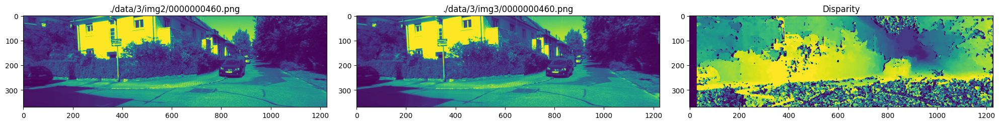

0 30 13


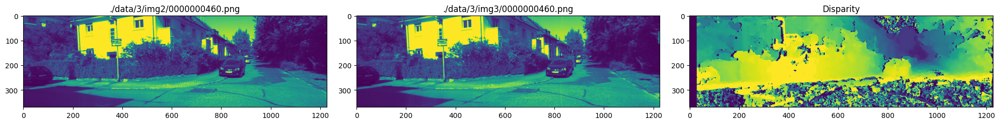

0 30 15


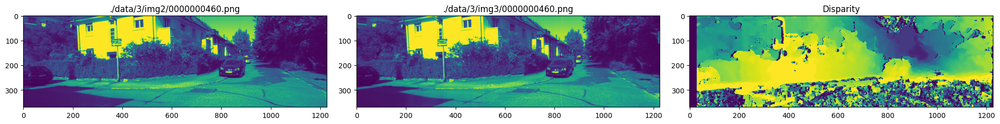

In [3]:
# 1. Generating disparity maps

# first we see which parameters work best
# for i in tqdm(range(num_images), desc='Processing disparity maps', ncols=100):

left_image_path, right_image_path = stereo_images_paths['2'][0], stereo_images_paths['3'][0]

left_image = cv2.imread(left_image_path, 0) 
right_image = cv2.imread(right_image_path, 0)


# min_disp_list = [0, 10, 20]
# num_disp_list = [5, 10, 15, 20, 25, 30, 40, 50, 75, 100]
# blk_size_size = [1, 3, 5, 9, 15, 21, 27, 37, 51, 71, 101, 131]

# min_disp_list = [0]
# num_disp_list = [25, 30, 35, 40]
# blk_size_size = [9, 13, 15]

# best results with

min_disp_list = [0]
num_disp_list = [30]
blk_size_size = [9, 13, 15]

for min_disparity in min_disp_list:
    for num_disparities in num_disp_list:
        for block_size in blk_size_size:

            print(f"{min_disparity} {num_disparities} {block_size}")

            stereo = cv2.StereoSGBM_create(minDisparity=min_disparity,
                                        numDisparities=num_disparities,
                                        blockSize=block_size)

            disparity_map = stereo.compute(left_image, right_image)

            '''
            Normalization can improve the contrast and visibility of disparities within the image. 
            If the raw disparity values cover only a small part of the available range, normalizing them can 
            stretch these values across the full range, making differences more apparent.
            '''
            normalized_disparity_map = cv2.normalize(disparity_map, disparity_map, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)

            fig, axes = plt.subplots(1, 3, figsize=(20, 30))
            axes[0].imshow(left_image)
            axes[0].set_title(left_image_path)
            axes[1].imshow(right_image)
            axes[1].set_title(right_image_path)
            axes[2].imshow(normalized_disparity_map)
            axes[2].set_title('Disparity')

            plt.tight_layout()
            plt.show()



Processing disparity maps:   0%|                                             | 0/21 [00:00<?, ?it/s]

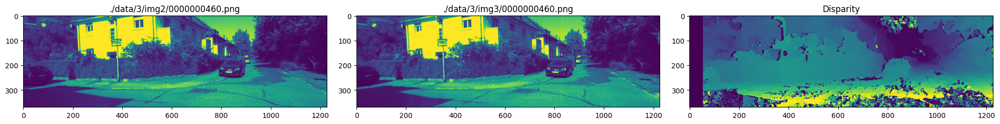

Processing disparity maps:   5%|█▊                                   | 1/21 [00:00<00:13,  1.50it/s]

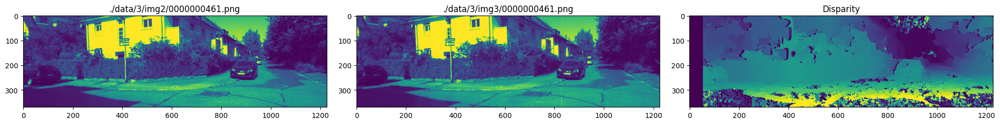

Processing disparity maps:  10%|███▌                                 | 2/21 [00:01<00:11,  1.61it/s]

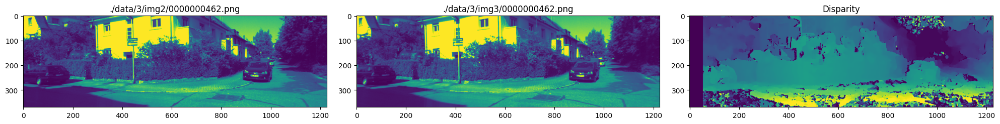

Processing disparity maps:  14%|█████▎                               | 3/21 [00:01<00:11,  1.58it/s]

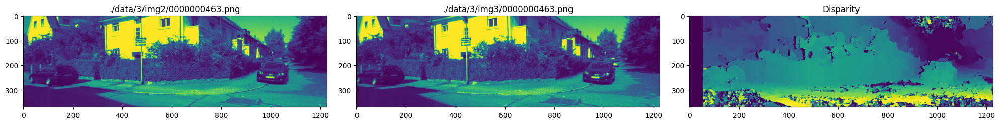

Processing disparity maps:  19%|███████                              | 4/21 [00:02<00:10,  1.62it/s]

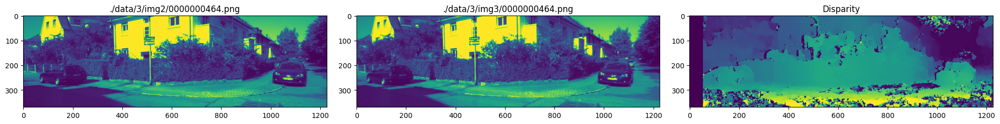

Processing disparity maps:  24%|████████▊                            | 5/21 [00:03<00:09,  1.69it/s]

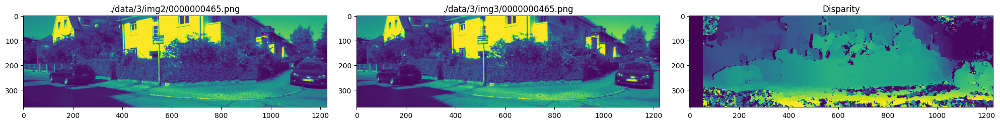

Processing disparity maps:  29%|██████████▌                          | 6/21 [00:03<00:08,  1.71it/s]

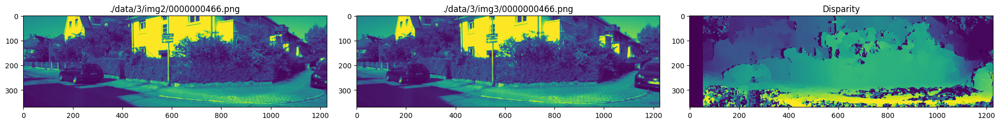

Processing disparity maps:  33%|████████████▎                        | 7/21 [00:04<00:08,  1.73it/s]

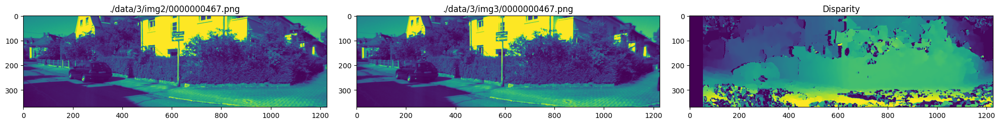

Processing disparity maps:  38%|██████████████                       | 8/21 [00:04<00:07,  1.74it/s]

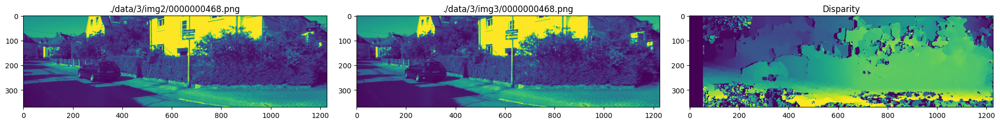

Processing disparity maps:  43%|███████████████▊                     | 9/21 [00:05<00:06,  1.73it/s]

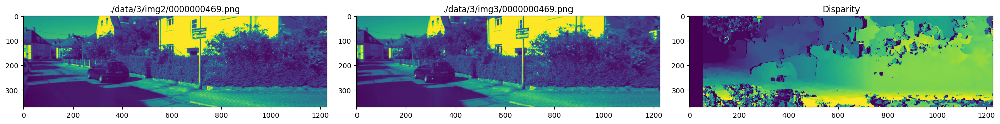

Processing disparity maps:  48%|█████████████████▏                  | 10/21 [00:06<00:06,  1.64it/s]

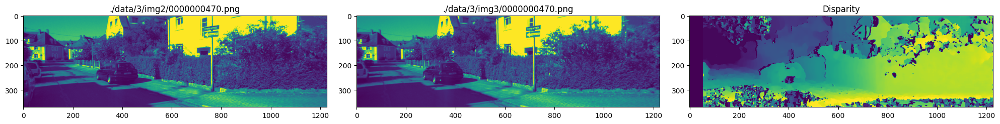

Processing disparity maps:  52%|██████████████████▊                 | 11/21 [00:06<00:06,  1.65it/s]

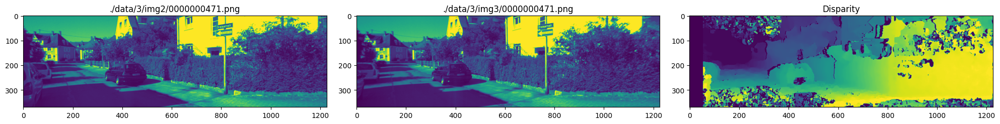

Processing disparity maps:  57%|████████████████████▌               | 12/21 [00:07<00:05,  1.65it/s]

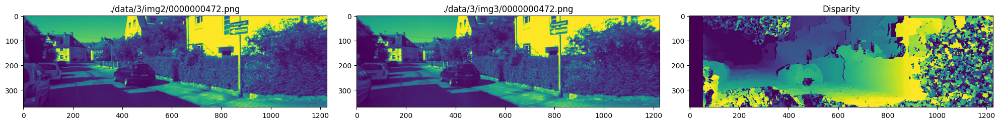

Processing disparity maps:  62%|██████████████████████▎             | 13/21 [00:07<00:04,  1.66it/s]

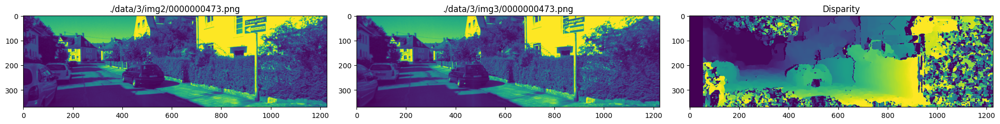

Processing disparity maps:  67%|████████████████████████            | 14/21 [00:08<00:04,  1.67it/s]

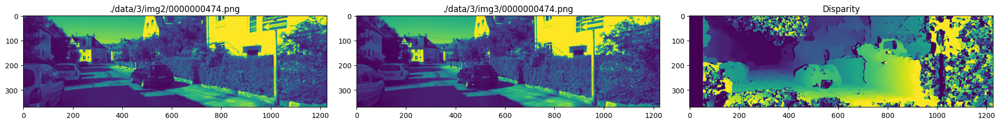

Processing disparity maps:  71%|█████████████████████████▋          | 15/21 [00:08<00:03,  1.68it/s]

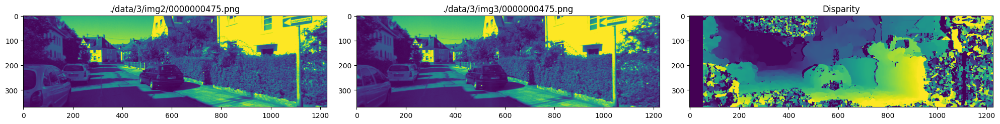

Processing disparity maps:  76%|███████████████████████████▍        | 16/21 [00:09<00:02,  1.67it/s]

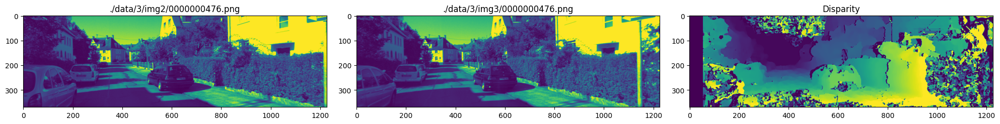

Processing disparity maps:  81%|█████████████████████████████▏      | 17/21 [00:10<00:02,  1.67it/s]

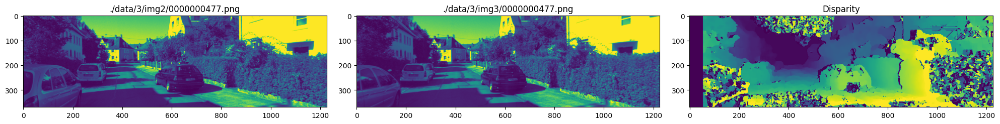

Processing disparity maps:  86%|██████████████████████████████▊     | 18/21 [00:10<00:01,  1.59it/s]

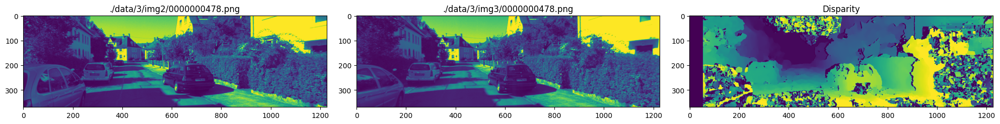

Processing disparity maps:  90%|████████████████████████████████▌   | 19/21 [00:11<00:01,  1.59it/s]

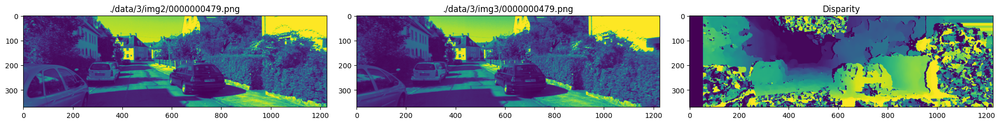

Processing disparity maps:  95%|██████████████████████████████████▎ | 20/21 [00:12<00:00,  1.61it/s]

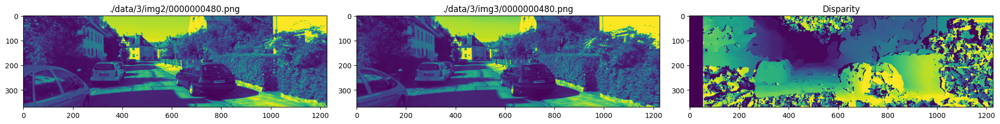

Processing disparity maps: 100%|████████████████████████████████████| 21/21 [00:12<00:00,  1.65it/s]


In [17]:

min_disparity = 5
num_disparities = 50
block_size = 17

disparity_maps = []

for i in tqdm(range(num_images), desc='Processing disparity maps', ncols=100):

    left_image_path, right_image_path = stereo_images_paths['2'][i], stereo_images_paths['3'][i]

    left_image = cv2.imread(left_image_path, 0) 
    right_image = cv2.imread(right_image_path, 0)            

    stereo = cv2.StereoSGBM_create(minDisparity=min_disparity,
                                numDisparities=num_disparities,
                                blockSize=block_size)

    disparity_map = stereo.compute(left_image, right_image)/block_size

    # disparity_map = cv2.normalize(disparity_map, disparity_map, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)

    disparity_maps.append(disparity_map)

    fig, axes = plt.subplots(1, 3, figsize=(20, 30))
    axes[0].imshow(left_image)
    axes[0].set_title(left_image_path)
    axes[1].imshow(right_image)
    axes[1].set_title(right_image_path)
    axes[2].imshow(disparity_map)
    axes[2].set_title('Disparity')

    plt.tight_layout()
    plt.show()

In [25]:
disp_file_path = './intermediate_results/3/disp_maps.pkl'

with open(disp_file_path, 'wb') as file:
    pickle.dump(disparity_maps, file)

In [4]:
disp_file_path = './intermediate_results/3/disp_maps.pkl'

with open(disp_file_path, 'rb') as file:
    disparity_maps = pickle.load(file)

In [19]:
# K: 
# 7.070912e+02 0.000000e+00 6.018873e+02 0.000000e+00 7.070912e+02 1.831104e+02 0.000000e+00 0.000000e+00 1.000000e+00

# baseline:
# 0.53790448812 m

baseline = 0.53790448812
K = np.array([
    [7.070912e+02, 0.000000e+00, 6.018873e+02],
    [0.000000e+00, 7.070912e+02, 1.831104e+02],
    [0.000000e+00, 0.000000e+00, 1.000000e+00]
])

In [20]:
# 2. Then, using the camera parameters and baseline information generate colored point clouds from each disparity map

point_clouds = []

for i in tqdm(range(num_images), desc='Generating pointclouds', ncols=100):
    left_image_path, right_image_path = stereo_images_paths['2'][i], stereo_images_paths['3'][i]

    left_image = cv2.imread(left_image_path) 
    right_image = cv2.imread(right_image_path) 

    # converting RGB
    left_image = cv2.cvtColor(left_image, cv2.COLOR_BGR2RGB)
    right_image = cv2.cvtColor(right_image, cv2.COLOR_BGR2RGB)
    disparity_map = disparity_maps[i]

    depth = baseline *  K[0, 0]/ disparity_map.astype(np.float32)
    depth[depth == np.inf] = 0  # Handling infinite values

    height, width = disparity_map.shape[:2]
    v, u = np.indices((height, width))
    x = (u - K[0, 2]) * depth / K[0, 0]
    y = (v - K[1, 2]) * depth / K[1, 1]
    z = depth

    # processing disparity maps
    points = np.stack([x, y, z], axis=-1)
    points = points.reshape(-1, 3)

    colors = [] # yes, Americanskii

    valid_disparity_range = np.where(disparity_map > 0)
    for y, x in zip(valid_disparity_range[0], valid_disparity_range[1]):
        color = left_image[y, x]
        colors.append(color) 
    colors = np.array(colors)
    colors = colors.reshape(-1, 3) / 255.0

    point_cloud = o3d.geometry.PointCloud()
    point_cloud.points = o3d.utility.Vector3dVector(points)
    point_cloud.colors = o3d.utility.Vector3dVector(colors)

    # flipping cloud
    # transformation = np.array([
    #     [1, 0, 0, 0],
    #     [0, -1, 0, 0],  
    #     [0, 0, -1, 0],
    #     [0, 0, 0, 1]
    # ])
    # point_cloud.transform(transformation)

    # o3d.visualization.draw_geometries([point_cloud])  # Visualize

    o3d.io.write_point_cloud(f"./intermediate_results/3/pcs/{i}.ply", point_cloud)
    point_clouds.append(point_cloud)


Generating pointclouds: 100%|███████████████████████████████████████| 21/21 [00:07<00:00,  2.66it/s]


In [21]:
# sample visualizer - run to see something

def visualize_pc(i):
    point_cloud = o3d.io.read_point_cloud(f"./intermediate_results/3/pcs/{i}.ply") 

    # flipping cloud
    transformation = np.array([
        [1, 0, 0, 0],
        [0, -1, 0, 0],  
        [0, 0, -1, 0],
        [0, 0, 0, 1]
    ])
    point_cloud.transform(transformation)

    o3d.visualization.draw_geometries([point_cloud])

visualize_pc(5)

_Sample pointcloud_

<img src="./intermediate_results/3/sample-pc-viz.png" alt="Sample pointcloud" width="1000"/>

In [22]:
# 3. Register (or transform) all the generated point clouds into your world frame by using the provided ground truth poses.

ground_truth_poses = np.loadtxt('./data/3/poses.txt')
ground_truth_poses = np.array([np.vstack((pose.reshape(3, 4), np.array([0, 0, 0, 1]))) for pose in ground_truth_poses])

first_pose_inv = np.linalg.inv(ground_truth_poses[0])

print(f"Shape of ground truth poses: {ground_truth_poses.shape}")

transformed_point_clouds = []

for i in tqdm(range(len(point_clouds)), ncols=100):
    pose = first_pose_inv @ ground_truth_poses[i]
    
    pcd = copy(point_clouds[i])
    pcd.transform(pose) 

    transformed_point_clouds.append(pcd)



Shape of ground truth poses: (21, 4, 4)


100%|███████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 95.95it/s]


In [23]:
# 4. Visualize the registered point cloud data, in color.  Use Open3D for this.

merged_point_cloud = o3d.geometry.PointCloud()

for pcd in transformed_point_clouds:
    merged_point_cloud += pcd

# flipping cloud
transformation = np.array([
    [1, 0, 0, 0],
    [0, -1, 0, 0],  
    [0, 0, -1, 0],
    [0, 0, 0, 1]
])
merged_point_cloud.transform(transformation)

o3d.visualization.draw_geometries([merged_point_cloud])


_Merged_

<img src="./intermediate_results/3/6.png" alt="Sample pointcloud" width="1000"/>
<img src="./intermediate_results/3/7.png" alt="Sample pointcloud" width="1000"/>